In [1]:
import sys
sys.path.append('/home/insauer/Climada/climada_python')
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import numpy as np
from climada.hazard.river_flood import RiverFlood
from climada.hazard.centroids import Centroids
from shapely.geometry.multipolygon import MultiPolygon
from climada.entity.exposures.base import Exposures
from climada.entity.exposures.gdp_asset import GDP2Asset
from climada.entity.impact_funcs.river_flood import flood_imp_func_set
from climada.engine import Impact

/home/insauer/anaconda3/envs/climada_env/lib/python3.7/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


In [2]:
PHL_FRC = '/home/insauer/mnt/cama-flood/results/isimip2a/gev/fldfrc_150arcsec_dbh_princeton_flopros.nc'
PHL_DPH  = '/home/insauer/mnt/cama-flood/results/isimip2a/gev/flddph_150arcsec_dbh_princeton_flopros.nc'
gdp_path = '/home/insauer/mnt/ebm/inga/climada_exposures/asset/'

In [3]:
shape_path = '/home/insauer/projects/WB_model/hhwb/data/shapes/phl_adm_psa_namria_20200529_shp/phl_admbnda_adm1_psa_namria_20200529.shp'
prvS = gpd.GeoDataFrame()
prvS = gpd.read_file(shape_path)
prvS

,Shape_Leng,Shape_Area,ADM1_EN,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,geometry
0,53.623497,1.050272,Autonomous Region in Muslim Mindanao,PH150000000,None,ARMM,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((119.46876 4.59360, 119.46881 4..."
1,8.027454,1.546712,Cordillera Administrative Region,PH140000000,None,CAR,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"POLYGON ((121.22208 18.50058, 121.22086 18.483..."
2,2.320234,0.050216,National Capital Region,PH130000000,None,NCR,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"POLYGON ((121.03842 14.78525, 121.03876 14.785..."
3,14.995101,1.043983,Region I,PH010000000,None,Ilocos Region,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((119.86596 15.81539, 119.86597 ..."
4,19.139048,2.241812,Region II,PH020000000,None,Cagayan Valley,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.46667 16.92135, 122.46674 ..."
5,15.949563,1.793513,Region III,PH030000000,None,Central Luzon,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((120.11687 14.76309, 120.11689 ..."
6,27.624115,1.326710,Region IV-A,PH040000000,None,Calabarzon,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.72165 13.36485, 122.72181 ..."
7,78.804542,2.220374,Region IV-B,PH170000000,None,Mimaropa,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((117.31260 7.50671, 117.31249 7..."
8,23.181441,1.196677,Region IX,PH090000000,None,Zamboanga Peninsula,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((121.88379 6.69138, 121.88380 6..."
9,44.923243,1.446324,Region V,PH050000000,None,Bicol Region,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.98823 11.73079, 122.98824 ..."


In [30]:
data = pd.read_csv('/home/insauer/projects/NC_Submission/Data/check_data/assembled_data_regions.csv')

data_phl = data.loc[(data['Country']=='PHL') & (data['Year']>1979) & (data['clim_forc']!='watch')]
natcat = data_phl.loc[((data_phl['clim_forc']=='princeton') & (data_phl['GHM']=='dbh')),
                      ['Year','natcat_flood_damages_2005_CPI']]
natcat

,Year,natcat_flood_damages_2005_CPI
101796,1980,1.189782e+05
112284,1981,4.240973e+07
122772,1982,2.355117e+06
133260,1983,0.000000e+00
143748,1984,0.000000e+00
154236,1985,2.406308e+07
164724,1986,0.000000e+00
175212,1987,0.000000e+00
185700,1988,4.730169e+07
196188,1989,1.527146e+06


In [4]:
shape = prvS.loc[prvS['ADM1_PCODE']=='PH100000000', 'geometry'].values[0]
shape

/home/insauer/Climada/climada_python/climada/util/plot.py:314: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


/home/insauer/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/feature_artist.py:225: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
  **dict(style))


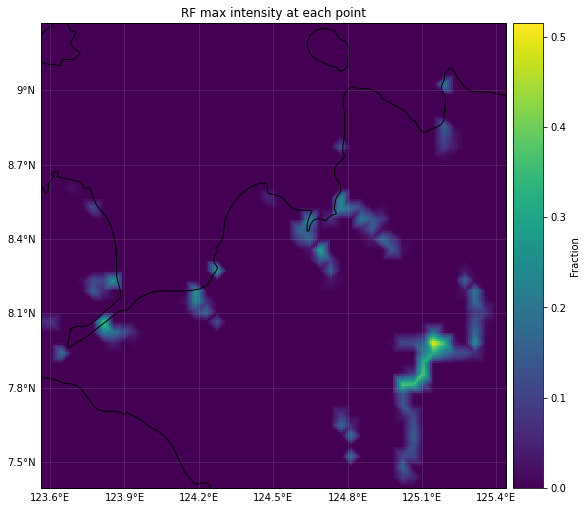

In [5]:
years = np.arange(1980,2011)
# calculate country level damage
rf_reg = RiverFlood()
#bas_shape=MultiPolygon([shape])
rf_reg.set_from_nc(shape=shape, years=years, dph_path=PHL_DPH, frc_path=PHL_FRC)
rf_reg.plot_fraction(0)

In [34]:
rf_reg.centroids.shape

(129, 43)

In [35]:
# set JRC impact functions
if_set = flood_imp_func_set()

Fraglich ob wir das exposure im steady state modellieren sollen oder im normalen mode...

In [36]:
## annual rescaling factors that allow to eliminate the SSP transition and get pure observations
ssp_resc = pd.read_csv('/home/insauer/projects/Attribution/Data/RescalingFactors_GDPobs_GDPjpnClean.csv')
## conversion factors to translate total national wealth into capital stock
cap_stock_conv = pd.read_csv('/home/insauer/projects/Attribution/Floods/Data/Input_Data/PostProcess_GDP2CapStock_rgdpnaCleanRM.csv')

# get rescaling factor to eliminate SSP for 2010 in Philippines
ssp_resc_che  = ssp_resc.loc[ssp_resc['ISO'] == 'PHL', str(2010)].values[0]
# get rescaling factor to convert from total wealth to capital stock
cap_stock_conv_che = cap_stock_conv.loc[cap_stock_conv['ISO'] == 'PHL', str(2010)].values[0]

In [37]:
from scipy.sparse import vstack
years = np.arange(1980,2011)

gdpa = GDP2Asset()

gdpa.set_from_raster(file_name='/home/insauer/data/Tobias/gdp_1850_2100_150arcsec.nc', band=161, src_crs=None, window=False,
                        geometry=shape)

gdpa['value'] = gdpa['value'] * ssp_resc_che * cap_stock_conv_che

In [38]:
gdpa['centroid_id']= np.arange(gdpa.shape[0])
gdpa

,longitude,latitude,value,centroid_id
0,120.770519,21.103956,0.0,0
1,120.812185,21.103956,0.0,1
2,120.853852,21.103956,0.0,2
3,120.895519,21.103956,0.0,3
4,120.937185,21.103956,0.0,4
...,...,...,...,...
5542,122.353850,15.770631,0.0,5542
5543,122.395516,15.770631,0.0,5543
5544,122.437183,15.770631,0.0,5544
5545,122.478849,15.770631,0.0,5545


/home/insauer/Climada/climada_python/climada/util/plot.py:314: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()
/home/insauer/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/feature_artist.py:225: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
  **dict(style))


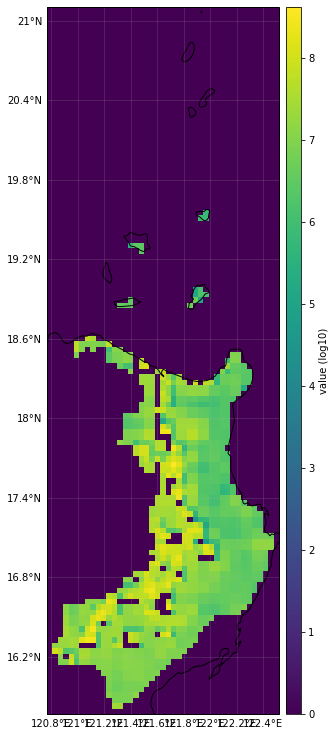

In [39]:
gdpa.plot_raster()

In [40]:
gdpa['if_RF'] = 7
gdpa['value'] = 1
gdpa.value_unit = 'USD'
gdpa

,longitude,latitude,value,centroid_id,if_RF
0,120.770519,21.103956,1,0,7
1,120.812185,21.103956,1,1,7
2,120.853852,21.103956,1,2,7
3,120.895519,21.103956,1,3,7
4,120.937185,21.103956,1,4,7
...,...,...,...,...,...
5542,122.353850,15.770631,1,5542,7
5543,122.395516,15.770631,1,5543,7
5544,122.437183,15.770631,1,5544,7
5545,122.478849,15.770631,1,5545,7


In [41]:
imp_0 = Impact()
imp_0.calc(gdpa, if_set, rf_reg, save_mat=True)

In [42]:
imp_0.imp_mat.todense().shape

(31, 5547)

In [43]:
imp_0.imp_mat.todense()[np.where(imp_0.imp_mat.todense()>0)]

matrix([[0.0544    , 0.10399999, 0.1248    , ..., 0.0992    , 0.1024    ,
         0.0336    ]])

In [44]:
rf_cnt = RiverFlood()
#bas_shape=MultiPolygon([shape])
rf_cnt.set_from_nc(countries=['PHL'], years=years, dph_path=PHL_DPH, frc_path=PHL_FRC)

gdpa_1 = Exposures()
gdpa_1.read_hdf5(gdp_path + 'asset_PHL_{}.h5'.format(str(2010)))
imp_cnt = Impact()
imp_cnt.calc(gdpa_1, if_set, rf_cnt, save_mat=True)

In [20]:
imp_cnt.at_event

array([5.12482329e+09, 7.00401109e+09, 2.81460658e+09, 2.98819014e+09,
       5.98735856e+09, 1.86120594e+10, 7.04658235e+09, 2.56232236e+09,
       1.97541170e+10, 4.35856290e+09, 6.13446061e+09, 2.83548910e+09,
       2.39296566e+09, 3.24827427e+09, 3.01961229e+09, 4.86404272e+09,
       5.43258533e+09, 5.77739454e+09, 1.85996992e+10, 2.37433319e+10,
       2.31170115e+10, 1.29384125e+10, 5.54185216e+09, 6.75937942e+09,
       6.03403861e+09, 1.00201320e+10, 4.85191532e+09, 7.00448844e+09,
       1.80981981e+10, 2.78445114e+10, 1.49672601e+10])

In [45]:
imp_df = np.array(imp_0.imp_mat.todense()).T

In [46]:
imp_0.at_event

array([ 1.90239994,  6.97895239,  0.72959998,  0.72959998,  6.49759981,
        0.72959998,  4.02165974,  0.72959998,  0.74879998,  4.44861525,
        7.17887717,  0.72959998,  0.72959998,  0.72959998,  0.74879998,
        0.72959998,  2.26079991,  0.74879998, 88.18310895,  6.28159982,
        4.2239999 , 30.73703161,  1.29947703,  0.72959998,  6.93856199,
        3.74359011,  2.21119994,  0.76319998, 12.4537956 , 62.30278819,
        3.20827699])

In [47]:
c_fac = np.array(natcat['natcat_flood_damages_2005_CPI'])/imp_cnt.at_event

In [48]:
fac_bool = np.where(c_fac>0)
c_fac[fac_bool[0]]=1
c_fac

array([1., 1., 1., 0., 0., 1., 0., 0., 1., 1., 1., 0., 1., 0., 1., 1., 1.,
       1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [49]:
imp_df.shape

(5547, 31)

In [50]:
c_fac=np.reshape(c_fac,(31))

In [51]:
imp_df_vul= imp_df*c_fac

In [32]:
#imp_df_vul_rel = imp_df_vul/imp_0.tot_value

In [52]:
column_names = np.arange(1980,2011).astype(str)
reg_imp_df = pd.DataFrame(data=imp_df_vul, columns=column_names)
reg_imp_df['Longitude']=imp_0.coord_exp[:,1]
reg_imp_df['Latitude']=imp_0.coord_exp[:,0]
reg_imp_df['Centroid_ID']=gdpa['centroid_id']
#reg_imp_df.drop(index=)
reg_imp_df = reg_imp_df.drop(index=reg_imp_df[reg_imp_df.iloc[:,:31].sum(axis=1)==0].index)

In [53]:
reg_imp_df.head(50)

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2004,2005,2006,2007,2008,2009,2010,Longitude,Latitude,Centroid_ID
2588,0.0,0.144615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.144615,...,0.163077,0.144615,0.0,0.0,0.172308,0.000000,0.0,121.103852,18.603960,2588
2631,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.015203,0.000000,0.0,121.103852,18.562293,2631
2678,0.0,0.039427,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.055556,0.023297,0.0,0.0,0.055556,0.000000,0.0,121.270518,18.520626,2678
2766,0.0,0.396660,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.396660,0.396660,0.0,0.0,0.396660,0.396660,0.0,121.353851,18.437293,2766
2767,0.0,0.398855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.442748,0.398855,0.0,0.0,0.416030,0.398855,0.0,121.395518,18.437293,2767
2768,0.0,0.470752,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.470752,0.470752,0.0,0.0,0.470752,0.470752,0.0,121.437184,18.437293,2768
2809,0.0,0.078400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.078400,0.078400,0.0,0.0,0.078400,0.078400,0.0,121.353851,18.395627,2809
2810,0.0,0.427200,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.470400,0.412800,0.0,0.0,0.441600,0.427200,0.0,121.395518,18.395627,2810
2811,0.0,0.425600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.425600,0.425600,0.0,0.0,0.425600,0.425600,0.0,121.437184,18.395627,2811
2853,0.0,0.179200,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.198400,0.179200,0.0,0.0,0.188800,0.188800,0.0,121.395518,18.353960,2853


In [54]:
gdpa['centroid_id']

0          0
1          1
2          2
3          3
4          4
        ... 
5542    5542
5543    5543
5544    5544
5545    5545
5546    5546
Name: centroid_id, Length: 5547, dtype: int64

In [55]:
reg_imp_df['Centroid_ID']

2588    2588
2631    2631
2678    2678
2766    2766
2767    2767
        ... 
5260    5260
5261    5261
5262    5262
5263    5263
5304    5304
Name: Centroid_ID, Length: 354, dtype: int64

In [56]:
non_affected_cells = list(set(gdpa['centroid_id']) ^ set(reg_imp_df['Centroid_ID']))

In [57]:
affected_cells = list(set(gdpa['centroid_id']) & set(reg_imp_df['Centroid_ID']))
affected_cells

[4104,
 4105,
 4106,
 4107,
 4108,
 4109,
 4110,
 4111,
 4112,
 4113,
 4148,
 4149,
 4150,
 4151,
 4152,
 4153,
 4154,
 4155,
 4156,
 4157,
 4158,
 4168,
 4169,
 4193,
 4194,
 4195,
 4196,
 4197,
 4199,
 4200,
 4201,
 4211,
 4235,
 4236,
 4237,
 4238,
 4239,
 4240,
 4242,
 4243,
 4244,
 4253,
 4254,
 4276,
 4277,
 4278,
 4279,
 4280,
 4281,
 4282,
 4283,
 4285,
 4286,
 4287,
 4288,
 4320,
 4321,
 4322,
 4324,
 4325,
 4326,
 4330,
 4362,
 4363,
 4367,
 4368,
 4373,
 4405,
 4411,
 4412,
 4416,
 4417,
 4445,
 4446,
 4447,
 4448,
 4453,
 4454,
 4460,
 4486,
 4487,
 4488,
 4493,
 4494,
 4495,
 4496,
 4497,
 4502,
 4503,
 4529,
 4536,
 4537,
 4538,
 4539,
 4546,
 4571,
 4579,
 4580,
 4581,
 4612,
 4613,
 4614,
 4622,
 4623,
 2588,
 4651,
 4655,
 4656,
 4665,
 4666,
 2631,
 4693,
 4694,
 4698,
 4699,
 4708,
 4709,
 4710,
 2678,
 4737,
 4740,
 4741,
 4742,
 4751,
 4752,
 4753,
 4754,
 4779,
 4780,
 4781,
 4782,
 4783,
 4784,
 4792,
 4793,
 4794,
 4795,
 4796,
 4797,
 2766,
 2767,
 2768,
 4823,

In [58]:
non_affected_cells

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [59]:
reg_imp_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/hazard_data/haz_data_reg_02.csv')

Now, we have to change the weight of non-affected households

In [60]:
hh_df = pd.read_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_02_pack.csv')
hh_df

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,hh_instance,Longitude,Latitude,Centroid_ID
0,55,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.0,121.687014,17.603991,3634.0
1,3803,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,1.0,121.228681,16.520660,4741.0
2,5164,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,2.0,120.978682,18.520656,2671.0
3,8667,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,3.0,121.687014,17.853991,3376.0
4,9629,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,4.0,121.603681,17.103992,4148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42914,26740,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,12.0,121.645347,17.853991,3375.0
42915,30521,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,13.0,121.687014,16.478993,4795.0
42916,31156,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,14.0,121.603681,16.812326,4449.0
42917,33804,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,15.0,121.770347,17.812324,3421.0


In [61]:
hhids = list(set(hh_df.loc[hh_df['Centroid_ID'].isin(non_affected_cells),'hhid']))
for hhid in hhids:
    hh_df.loc[hh_df['Centroid_ID'].isin(non_affected_cells) & (hh_df['hhid']==hhid), 'weight'] = hh_df.loc[hh_df['Centroid_ID'].isin(non_affected_cells) & (hh_df['hhid']==hhid), 'weight'].sum()
    hh_df = hh_df.drop(index=hh_df.loc[hh_df['Centroid_ID'].isin(non_affected_cells) & (hh_df['hhid']==hhid)].index[1:])

In [65]:
hh_df.loc[hh_df['Centroid_ID'].isin(affected_cells)]

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,hh_instance,Longitude,Latitude,Centroid_ID
0,55,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.0,121.687014,17.603991,3634.0
1,3803,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,1.0,121.228681,16.520660,4741.0
3,8667,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,3.0,121.687014,17.853991,3376.0
4,9629,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,4.0,121.603681,17.103992,4148.0
5,12908,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,5.0,121.728681,16.687326,4581.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42911,22161,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,9.0,121.562014,16.853992,4405.0
42913,26208,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,11.0,121.645347,16.520660,4751.0
42914,26740,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,12.0,121.645347,17.853991,3375.0
42915,30521,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,13.0,121.687014,16.478993,4795.0


In [63]:
hh_df

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,hh_instance,Longitude,Latitude,Centroid_ID
0,55,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.0,121.687014,17.603991,3634.0
1,3803,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,1.0,121.228681,16.520660,4741.0
2,5164,2510,2,178.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,2.0,120.978682,18.520656,2671.0
3,8667,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,3.0,121.687014,17.853991,3376.0
4,9629,2510,2,20.0,7,247890,24000,0.164072,25473.290679,29118.32,0,0,4.0,121.603681,17.103992,4148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42911,22161,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,9.0,121.562014,16.853992,4405.0
42913,26208,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,11.0,121.645347,16.520660,4751.0
42914,26740,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,12.0,121.645347,17.853991,3375.0
42915,30521,29912,2,20.0,2,77738,1000,0.460683,940.544158,20940.56,0,1,13.0,121.687014,16.478993,4795.0


In [ ]:
hh_df = hh_df.drop(columns=['Unnamed: 0'])

In [ ]:
hh_df['fhhid']=np.arange(hh_df.shape[0])

In [64]:
hh_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_02_pack.csv')

In [102]:
for cell in affected_cells:
    print(cell)
    hhids = list(set(hh_df.loc[hh_df['Centroid_ID']==cell,'hhid']))
    print(hh_df.loc[(hh_df['Centroid_ID']==cell)].shape[0])
    print(len(hhids))
    if hh_df.loc[(hh_df['Centroid_ID']==cell)].shape[0]> len(hhids):
        for hhid in hhids:
            if hh_df.loc[(hh_df['Centroid_ID']==cell) & (hh_df['hhid']==hhid)].shape[0]>1:
                #print(hhid)
                hh_df.loc[(hh_df['Centroid_ID']==cell) & (hh_df['hhid']==hhid),'weight'] = hh_df.loc[(hh_df['Centroid_ID']==cell) & (hh_df['hhid']==hhid), 'weight'].sum()
                #print(hh_df.loc[(hh_df['Centroid_ID']==cell) & (hh_df['hhid']==hhid),'weight'].sum())
                
                hh_df = hh_df.drop(index=hh_df.loc[(hh_df['Centroid_ID']==cell) & (hh_df['hhid']==hhid)].index[1:])

4104
1110
934
4105
2991
2219
4106
2973
2174
4107
1952
1819
4108
1941
1420
4109
1284
1224
4110
1329
1329
4111
3896
2219
4112
3861
2219
4113
1862
1660
4148
3006
2047
4149
2988
2008
4150
1962
1857
4153
1327
1327
4154
3912
2146
4155
3876
2219
4156
1872
1507
4157
1841
1841
4158
56
50
4168
64
60
4169
63
50
4196
2108
1850
4197
2129
1543
4200
2158
1549
4201
470
448
4211
348
335
4235
3017
2000
4236
2381
1812
4237
2376
2158
4238
2112
1699
4239
2112
1624
4240
2118
1631
4242
2190
1563
4243
2160
1640
4244
472
433
4253
293
293
4254
350
350
4276
0
0
4277
2364
2018
4278
2354
1858
4279
1803
1557
4280
1832
1763
4281
3492
2219
4282
3446
2219
4283
843
843
4285
295
295
4286
311
311
4287
1246
1246
4288
1227
1227
4320
2360
1927
4321
2350
1830
4322
1800
1436
4324
3500
2174
4325
3454
2112
4326
836
792
4362
1656
1180
4363
2028
1594
4367
1332
1245
4368
1318
1108
4373
399
378
4405
1661
1661
4411
1305
1175
4412
512
504
4416
393
393
4417
389
389
4445
153
153
4446
204
204
4447
3080
2054
4448
3042
2219
4454
1237
1237

In [103]:
hh_df

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance,Longitude,Latitude,Centroid_ID,fhhid
0,0,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,0.0,121.687014,17.603991,3634.0,1169919
4,4,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,4.0,121.687014,17.645658,3591.0,1169923
8,8,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,8.0,121.728681,17.603991,3635.0,1169927
12,12,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,12.0,121.728681,17.645658,3592.0,1169931
16,16,2510,2,196,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,16.0,121.520348,16.687326,4576.0,1169935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
816074,816074,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,317.0,121.645347,18.145657,3074.0,1985993
816081,816081,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,324.0,121.853680,17.353992,3896.0,1986000
816083,816083,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,326.0,121.728681,17.937324,3291.0,1986002
816084,816084,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,327.0,122.020347,17.062325,4201.0,1986003


In [104]:
hh_df = hh_df.drop(columns=['Unnamed: 0'])

In [106]:
hh_df['fhhid']=np.arange(hh_df.shape[0])

In [109]:
hh_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_sm_02.csv')

In [33]:
hh_df = pd.read_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_sm_02.csv')

In [36]:
hh_df['affected']=np.nan

In [38]:
hh_df.loc[hh_df['Centroid_ID'].isin(non_affected_cells), 'affected'] = 0

In [41]:
hh_df.loc[hh_df['Centroid_ID'].isin(affected_cells), 'affected'] = 1

In [44]:
hh_df['affected'] = hh_df['affected'].astype(int)

In [45]:
hh_df.loc[hh_df['Centroid_ID'].isin(affected_cells)]

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance,Longitude,Latitude,Centroid_ID,fhhid,affected
0,0,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,0.0,121.687014,17.603991,3634.0,0,1
1,4,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,4.0,121.687014,17.645658,3591.0,1,1
2,8,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,8.0,121.728681,17.603991,3635.0,2,1
3,12,2510,2,4,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,12.0,121.728681,17.645658,3592.0,3,1
5,30,2510,2,2,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,30.0,121.187015,16.520660,4740.0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
322897,816074,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,317.0,121.645347,18.145657,3074.0,322897,1
322898,816081,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,324.0,121.853680,17.353992,3896.0,322898,1
322899,816083,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,326.0,121.728681,17.937324,3291.0,322899,1
322900,816084,29912,2,1,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,327.0,122.020347,17.062325,4201.0,322900,1


In [ ]:
hh_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_sm_02.csv')